In [2]:
# Import other modules not related to PySpark
import os
import sys 
import seaborn as sns 
import pandas as pd
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick  
import matplotlib
from mpl_toolkits.mplot3d import Axes3D 
import math
from IPython.core.interactiveshell import InteractiveShell
from datetime import *
import statistics as stats
# This helps auto print out the items without explixitly using 'print'
InteractiveShell.ast_node_interactivity = "all" 
%matplotlib inline  

In [145]:
df = pd.read_csv('All incidents DATA.csv' , sep=";")
df.columns 

Index(['Numero de ticket', '[Description courte incident]',
       'Service manager HELP', 'Nom application', 'Date de creation',
       'Duree de premiere prise en charge', 'Date de resolution',
       'Date de resolution maximum', 'Statut du ticket', 'Type de ticket',
       'Cause', 'Cause reelle', 'Nom de l'action', 'Intervenant en charge',
       '_IDApplication', 'Unnamed: 15'],
      dtype='object')

In [2]:
df2 = pd.read_excel('Incident OT2_Complet (1).xlsx' , sheet_name="Incident OT 2 (33)")
df2.columns

Index(['Numéro ticket', 'Statut', 'Priorité', 'Date de création',
       'Date de création de l'action en cours',
       'Date de prise en charge de l'action en cours', 'Sujet',
       'Brève description', 'Objet de l'incident', 'Groupe', 'Type de groupe',
       'Intervenant', 'Solution',
       'Entité du responsable du groupe de la dernière action', 'Cause réelle',
       'Code Appli', 'Code Domaine', 'Incident pére', 'N° Problème',
       'Bénéficiaire', 'Date de résolution'],
      dtype='object')

In [3]:
df = pd.read_csv('All incidents DATA.csv' , sep=";")
df.drop(columns=['Unnamed: 15'] , inplace=True)
rename_dict = {
    'Numero de ticket': 'Numero ticket',
    '[Description courte incident]': 'Breve description',
    'Service manager HELP': 'Service Manager HELP',
    'Nom application': 'Nom appli',
    'Date de creation': 'Date de creation',
    'Duree de premiere prise en charge': "Duree de premier prise en charge",
    'Date de resolution': 'Date de resolution',
    'Date de resolution maximum': 'Max Resolution Date',
    'Statut du ticket': 'Statut',
    'Type de ticket': 'Type de ticket',
    'Cause': 'Cause',
    'Cause reelle': 'Cause reelle',
    'Nom de laction': 'Action Name',
    'Intervenant en charge': 'Intervenant',
    'IDApplication': 'Code Appli',
}

# Rename columns
df.rename(columns=rename_dict, inplace=True)

df2 = pd.read_excel('Incident OT2_Complet (1).xlsx' , sheet_name="Incident OT 2 (33)")
new_column_names = {
    "Numéro ticket": "Numero ticket",
    "Statut": "Statut",
    "Priorité": "Priorite",
    "Date de création": "Date de creation",
    "Date de création de l'action en cours": "Date de creation de laction en cours",
    "Date de prise en charge de l'action en cours": "Date de prise en charge de laction en cours",
    "Sujet": "Sujet", 
    "Brève description": "Breve description",
    "Objet de l'incident": "Objet de lincident", 
    "Groupe": "Groupe",
    "Type de groupe": "Type de groupe",
    "Intervenant": "Intervenant", 
    "Solution": "Solution",
    "Entité du responsable du groupe de la dernière action": "Entite du responsable du groupe de la derniere action",
    "Cause réelle": "Cause reelle",
    "Code Appli": "Code Appli",
    "Code Domaine": "Code Domaine",
    "Incident pére": "Incident pere",
    "N° Problème": "N Problème",
    "Bénéficiaire": "Beneficiaire",
    "Date de résolution": "Date de resolution"
}

# Rename the columns

df2['Statut'] = df2['Statut'].replace('-', pd.NA)

df2.rename(columns=new_column_names, inplace=True)


merged_df = pd.merge(df, df2[['Numero ticket', 'Solution', 'Groupe', 
                               'Entite du responsable du groupe de la derniere action', 
                               'Priorite', 'Beneficiaire' , 'Statut' , 'Date de creation de laction en cours'
                               , 'Date de prise en charge de laction en cours']], 
                     on='Numero ticket', how='left')
merged_df['Statut'] = merged_df['Statut_x'] + merged_df['Statut_y'] 
merged_df.drop(columns=['Statut_x' , 'Statut_y'] , inplace=True)
merged_df.to_csv('merged4.csv' , sep=";" , index=False)
### green 


In [33]:
df.columns 

Index(['Numero ticket', 'Breve description', 'Service Manager HELP',
       'Nom appli', 'Date de creation', 'Duree de premier prise en charge',
       'Date de resolution', 'Max Resolution Date', 'Statut', 'Type de ticket',
       'Cause', 'Cause reelle', 'Action Name', 'Intervenant', 'Code Appli'],
      dtype='object')

In [34]:
df2.columns 

Index(['Numero ticket', 'Statut', 'Priorite', 'Date de creation',
       'Date de creation de laction en cours',
       'Date de prise en charge de laction en cours', 'Sujet',
       'Breve description', 'Objet de lincident', 'Groupe', 'Type de groupe',
       'Intervenant', 'Solution',
       'Entite du responsable du groupe de la derniere action', 'Cause reelle',
       'Code Appli', 'Code Domaine', 'Incident pere', 'N Problème',
       'Beneficiaire', 'Date de resolution'],
      dtype='object')

In [32]:
merged_df.to_csv('merged3.csv' , sep=";" , index=False) 

In [31]:
merged_df['Statut'].value_counts()

-Clôturé automatiquement            7932
-Clôturé                            2581
-Annulation utilisateur              112
-En cours                             83
-Résolu                               81
-Suspendu                             29
-En attente de montée de version      22
-Redirigé                             21
-Incident lié                          8
-Refus de la solution                  6
Refus de la solutionRedirigé           2
-Réouvert                              1
Name: Statut, dtype: int64

In [105]:
set_table1 = set(df.columns)
set_table2 = set(df2.columns)

# Find common columns
common_columns = set_table1.intersection(set_table2)

# Find columns unique to each table
unique_to_table1 = set_table1.difference(set_table2)
unique_to_table2 = set_table2.difference(set_table1)

# Convert results to lists for better readability
common_columns_list = list(common_columns)
unique_to_table1_list = list(unique_to_table1)
unique_to_table2_list = list(unique_to_table2)

# Display the results
print("Common columns:", common_columns_list)
print("Columns unique to table 1:", unique_to_table1_list)
print("Columns unique to table 2:", unique_to_table2_list)


Common columns: ['Date de création', 'Cause réelle', 'Intervenant', 'Date de resolution', 'Brève description', 'Numéro ticket', 'Statut', 'Code Appli']
Columns unique to table 1: ['Duree de premier prise en charge', 'Cause', 'Type de ticket', 'Nom appli', 'Service Manager HELP', 'Action Name', 'Max Resolution Date']
Columns unique to table 2: ['Type de groupe', 'Code Domaine', 'Priorité', 'Groupe', "Date de prise en charge de l'action en cours", 'Solution', 'Sujet', "Objet de l'incident", 'N° Problème', 'Bénéficiaire', 'Entité du responsable du groupe de la dernière action', "Date de création de l'action en cours", 'Incident pére']


In [142]:
for value in df['Numéro ticket']: 
    print(value)  

I240215_0301
I240215_0299
I240215_0271
I240215_0260
I240215_0258
I240215_0244
I240215_0231
I240215_0227
I240215_0225
I240215_0221
I240215_0214
I240215_0207
I240215_0197
I240215_0196
I240215_0191
I240215_0187
I240215_0186
I240215_0182
I240215_0179
I240215_0171
I240215_0166
I240215_0162
I240215_0155
I240215_0150
I240215_0139
I240215_0137
I240215_0129
I240215_0128
I240215_0124
I240215_0118
I240215_0111
I240215_0109
I240215_0106
I240215_0102
I240215_0095
I240215_0092
I240215_0088
I240215_0071
I240215_0068
I240215_0066
I240215_0059
I240215_0058
I240215_0051
I240215_0050
I240215_0049
I240215_0044
I240215_0027
I240215_0025
I240215_0021
I240215_0015
I240214_0337
I240214_0333
I240214_0332
I240214_0330
I240214_0325
I240214_0324
I240214_0321
I240214_0305
I240214_0299
I240214_0290
I240214_0286
I240214_0277
I240214_0276
I240214_0274
I240214_0271
I240214_0266
I240214_0256
I240214_0243
I240214_0239
I240214_0237
I240214_0232
I240214_0226
I240214_0218
I240214_0203
I240214_0196
I240214_0185
I240214_0178

In [141]:
for value in df2['Numéro ticket']: 
    print(value) 

I160519_0150
I160519_0151
I160519_0176
I160519_0186
I160519_0200
I160520_0037
I160520_0055
I160520_0185
I160520_0199
I160523_0006
I160523_0008
I160523_0029
I160523_0052
I160523_0070
I160523_0075
I160523_0081
I160523_0095
I160523_0098
I160523_0124
I160523_0133
I160523_0148
I160523_0154
I160523_0188
I160524_0001
I160524_0002
I160524_0005
I160524_0030
I160524_0044
I160524_0046
I160524_0081
I160524_0104
I160524_0154
I160524_0160
I160524_0172
I160524_0184
I160525_0001
I160525_0002
I160525_0011
I160525_0013
I160525_0035
I160525_0045
I160525_0096
I160525_0103
I160525_0109
I160525_0129
I160525_0136
I160525_0143
I160525_0145
I160525_0158
I160526_0003
I160526_0009
I160526_0011
I160526_0035
I160526_0059
I160526_0063
I160526_0101
I160526_0104
I160526_0110
I160526_0116
I160526_0150
I160526_0160
I160527_0002
I160527_0083
I160527_0084
I160527_0112
I160530_0010
I160530_0042
I160530_0095
I160530_0102
I160530_0152
I160530_0197
I160530_0203
I160530_0208
I160530_0218
I160531_0002
I160531_0027
I160531_0064

In [107]:
df2[df2['Numéro ticket']=='I210318_0225']  

,Numéro ticket,Statut,Priorité,Date de création,Date de création de l'action en cours,Date de prise en charge de l'action en cours,Sujet,Brève description,Objet de l'incident,Groupe,Type de groupe,Intervenant,Solution,Entité du responsable du groupe de la dernière action,Cause réelle,Code Appli,Code Domaine,Incident pére,N° Problème,Bénéficiaire,Date de resolution
10885,I210318_0225,En cours,2,2021-03-18 14:38:18,2021-03-18 17:08:12,2021-03-18 17:08:12,Incidents/Informatique/Application métier,NaN,Dans la ZDP le fichier 'TIERS_CARACT_GENERALES...,DATA CORE BANKING,DATA,NaN,NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,ZDP,RSQ,NaN,NaN,"Damata, Manta",NaT


In [103]:
df[df['Numéro ticket']=='I200615_0160'] 

,Numéro ticket,Brève description,Service Manager HELP,Nom appli,Date de création,Duree de premier prise en charge,Date de resolution,Max Resolution Date,Statut,Type de ticket,Cause,Cause réelle,Action Name,Intervenant,Code Appli
255359,I200615_0160,Probleme CP 4717035,https://com15.easyvista.com/autoconnect_mail.p...,R�f�rentiel - BCP,15/06/2020 11:05:00,Non Renseign�e,15/06/2020 13:09:00,29/06/2020 :,-,Incident,Ev�nement externe � Bpifrance - Partenaire,Ev�nement externe � Bpifrance - Partenaire,-,-,202402|BCP


In [34]:
df['Code Appli'].value_counts()

-                                  179208
OAD Octroi - GDC                    20283
Messagerie Outlook                  19379
Cassiopae Web                       17966
VPN AF Cloud                        14095
                                    ...  
Gestion des Pouvoirs Bancaires          1
Gestion des PEE et FASEP V2             1
Gestion des PEE et FASEP - PYCN         1
Gestion de stock                        1
Wowza                                   1
Name: Code Appli, Length: 775, dtype: int64

In [36]:
pd.set_option('display.max_columns', None)

df.head()

,Numéro ticket,Brève description,Service Manager HELP,Code Appli,Date de création,Date de prise en charge de l'action en cours,Date de création,Max Resolution Date,Statut,Type de ticket,Cause,Cause réelle,Action Name,Intervenant,Code Applii
0,I240215_0301,PROBLEME DE DESCENTE CASSIOPAE,https://com15.easyvista.com/autoconnect_mail.p...,OAD Octroi - GDC,15/02/2024 16:31:00,Non Renseign�e,15/02/2024 17:18:00,16/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|GDC
1,I240215_0299,Notification dossier,https://com15.easyvista.com/autoconnect_mail.p...,OAD Octroi - GDC,15/02/2024 16:23:00,Non Renseign�e,15/02/2024 16:53:00,16/02/2024 :,-,Assistance,Erreur d�utilisation applicative,Erreur d�utilisation applicative,-,-,202402|GDC
2,I240215_0271,configuration ibm,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:46:00,Non Renseign�e,15/02/2024 15:47:00,21/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|
3,I240215_0260,2e mobile sur IBM,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:34:00,Non Renseign�e,15/02/2024 15:36:00,21/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|
4,I240215_0258,�cran externe non reconnu,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:31:00,16,-,21/02/2024 :,En cours,Assistance,-,-,Traitement de l'incident,-,202402|


In [90]:
df['Date de création'] = df['Date de création'].replace('-', pd.NA)

# Convert the column to datetime
df['Date de création'] = pd.to_datetime(df['Date de création'], errors='coerce')

# Find the oldest date
oldest_date = df['Date de création'].min()
print("The oldest date:", oldest_date)      

The oldest date: 2016-01-06 02:15:00


In [94]:
len(df2)

10900

In [93]:
common_ticket_ids = set(df['Numéro ticket']).intersection(df2['Numéro ticket'])

# Convert the set to a list if needed
common_ticket_ids = list(common_ticket_ids)

print("Common Ticket IDs:", common_ticket_ids)
print(len(common_ticket_ids)) 

Common Ticket IDs: ['I200615_0160', 'I181109_0004', 'I191004_0009', 'I170117_0260', 'I190320_0216', 'I190411_0250', 'I190207_0070', 'I201126_0229', 'I210122_0066', 'I190822_0148', 'I180706_0042', 'I180305_0094', 'I190415_0290', 'I170707_0059', 'I200204_0246', 'I160622_0154', 'I171109_0329', 'I201019_0341', 'I180328_0101', 'I200317_0213', 'I200715_0051', 'I190405_0038', 'I201104_0385', 'I200731_0024', 'I210111_0326', 'I180208_0242', 'I170329_0065', 'I201118_0126', 'I191128_0228', 'I200407_0258', 'I200420_0090', 'I190411_0161', 'I160705_0091', 'I171106_0304', 'I170411_0093', 'I200213_0230', 'I191212_0014', 'I160824_0106', 'I160822_0141', 'I190212_0238', 'I170705_0120', 'I170302_0319', 'I191009_0074', 'I170201_0077', 'I171211_0263', 'I161108_0060', 'I161116_0056', 'I200527_0199', 'I190301_0099', 'I190111_0172', 'I210211_0170', 'I201120_0047', 'I191128_0006', 'I171212_0110', 'I191001_0301', 'I191011_0016', 'I180822_0112', 'I170907_0123', 'I161116_0136', 'I170308_0059', 'I180209_0082', 'I20

In [137]:
merged_df[merged_df['Numéro ticket']=='I200615_0160'] 

,Numéro ticket,Brève description,Service Manager HELP,Nom appli,Date de création,Duree de premier prise en charge,Date de resolution,Max Resolution Date,Statut,Type de ticket,Cause,Cause réelle,Action Name,Intervenant,Code Appli,Solution,Groupe,Entité du responsable du groupe de la dernière action,Priorité,Bénéficiaire
255360,I200615_0160,Probleme CP 4717035,https://com15.easyvista.com/autoconnect_mail.p...,R�f�rentiel - BCP,15/06/2020 11:05:00,Non Renseign�e,15/06/2020 13:09:00,29/06/2020 :,-,Incident,Ev�nement externe � Bpifrance - Partenaire,Ev�nement externe � Bpifrance - Partenaire,-,-,202402|BCP,"Bonjour,_x000D_\nLe CP a été complété dans la ...",COM BCP BASE CLIENT PARTENAIRE,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,3,"Belhassen, Julien"


In [ ]:
### columns to take from df2 ===> df1 

###  SOLUTION //Groupe ((add new groups to previous dataset )) / objet de lincident / 
### Entité du responsable du groupe de la dernière action / Priorité  // benefic 
### date crea action // date reso action // c bon we have those 
###  




<Figure size 864x432 with 0 Axes>

<AxesSubplot:xlabel='Priorité', ylabel='count'>

Text(0.5, 1.0, 'Count of Tickets by Priority and Status')

Text(0.5, 0, 'Priority')

Text(0, 0.5, 'Count of Tickets')

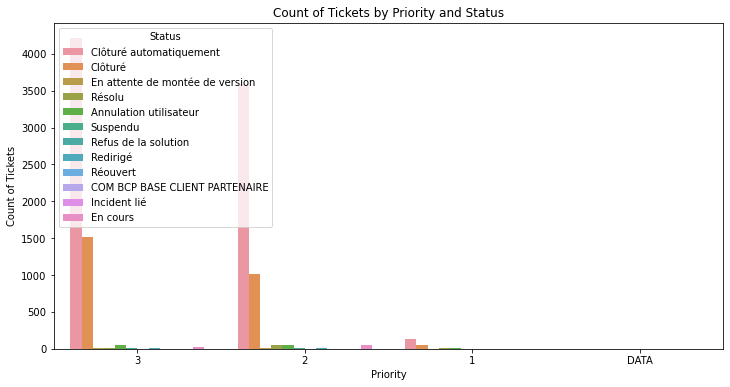

In [50]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df2, x='Priorité', hue='Statut')
plt.title('Count of Tickets by Priority and Status')
plt.xlabel('Priority')
plt.ylabel('Count of Tickets')
plt.legend(title='Status')
plt.show()


In [64]:
df2[df2['Priorité']==1 ] 

,Numéro ticket,Statut,Priorité,Date de création,Date de création de l'action en cours,Date de prise en charge de l'action en cours,Sujet,Brève description,Objet de l'incident,Groupe,Type de groupe,Intervenant,Solution,Entité du responsable du groupe de la dernière action,Cause réelle,Code Appli,Code Domaine,Incident pére,N° Problème,Bénéficiaire,Date de résolution,Difference in Days
137,I160608_0116,Clôturé automatiquement,1,2016-06-08 15:20:42,2016-06-08 15:29:04,2016-06-08 16:32:47,Incidents/Informatique/Application métier,NaN,"Bonjour,_x000D_\nMerci de renseigner le type d...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nLe type de registre est à pré...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Chauvin, Veronique",2016-06-08 16:32:47,0.0
138,I160608_0122,Clôturé automatiquement,1,2016-06-08 15:24:54,2016-06-08 15:28:10,2016-06-09 11:54:43,Incidents/Informatique/Application métier,NaN,Impossible d'ouvrir le CP suivant : 4121979. L...,COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nLes problèmes de l’outil de r...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Mariau, Gregoire",2016-06-09 11:54:43,0.0
376,I160726_0121,Clôturé,1,2016-07-26 15:36:17,2016-11-15 12:22:33,2016-11-15 12:22:33,Incidents/Informatique/Application métier,NaN,Une fermeture d'un motif de risque de contrepa...,DATA RISQUES,DATA,"Letassey, Laetitia","Bonjour,_x000D_\nLe correctif lié à la fermetu...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Bug applicatif,BSR,RSQ,NaN,NaN,"Malvaud, Marie-christine",2017-05-29 18:48:19,307.0
506,I160902_0027,Clôturé automatiquement,1,2016-09-02 09:25:05,2016-09-02 16:05:26,2016-10-10 16:42:33,Incidents/Informatique/Application métier,NaN,"Bonjour,_x000D_\nJe voulais utiliser dans l'un...",DATA QUALIF,DATA,"Bonan, Patrick",NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Cas non prévu - évolution,BUO,DSI,NaN,NaN,"Abonyi, Pascale",2016-10-10 16:42:33,38.0
530,I160908_0073,Clôturé automatiquement,1,2016-09-08 11:58:18,2016-09-09 10:51:00,2016-09-09 10:51:00,Incidents/Informatique/Application métier,NaN,"Bonjour,_x000D_\nIl s'agit d'un incident sur l...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc",Mise à jour effectué dans la BCP,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Peyrin, Catherine",2016-09-22 12:52:47,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,I210309_0007,Résolu,1,2021-03-09 06:04:49,2021-03-09 12:16:36,2021-03-09 12:16:37,Incidents/Informatique/Infrastructure/Infogérant,2021-03-09 05:05:31 Job J3BTA5JE [Group: J0CTR...,2021-03-09 05:05:31 Job J3BTA5JE [Group: J0CTR...,DATA PROD,DATA,"Reverte, Benoit",Problème de donnée sur le fichier ZDP_BSR_RSQ_...,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Anomalie technique,BSR,RSQ,NaN,NaN,"Infogérant, ATOS",2021-03-09 12:16:37,0.0
10813,I210309_0012,Résolu,1,2021-03-09 06:42:49,2021-03-09 12:35:13,2021-03-09 12:35:13,Incidents/Informatique/Infrastructure/Infogérant,2021-03-09 06:44:01 Job J3BTA5JE [Group: J0CTR...,2021-03-09 06:44:01 Job J3BTA5JE [Group: J0CTR...,DATA PROD,DATA,"Reverte, Benoit",Erreur de format sur une ligne du fichier :_x0...,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Anomalie technique,BSR,RSQ,NaN,NaN,"Infogérant, ATOS",2021-03-09 12:35:13,0.0
10851,I210312_0115,En cours,1,2021-03-12 11:43:19,2021-03-15 09:27:08,2021-03-15 09:27:08,Incidents/Informatique/Application métier,NaN,"Bonjour,Une erreur s'est produite dans la sais...",DATA CORE BANKING,DATA,"Le calve, Jean-francois",NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,IFO,REF,NaN,NaN,"Pessans, Elisabeth",NaT,NaN
10897,I210322_0010,En cours,1,2021-03-22 08:17:07,2021-03-22 09:30:19,2021-03-22 09:30:19,Incidents/Informatique/Application métier,NaN,"Bonjour Jean-Clément,FI pour demander de passe...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Roch, Olivier",NaN,Bpifrance/DIRECTION GENERA

In [83]:
print('avg response for incident priority 1 : ' , df2[df2['Priorité']==1 ]['Difference in Days'].mean() )
print('avg response for incident priority 2 : ' , df2[df2['Priorité']==2 ]['Difference in Days'].mean() )
print('avg response for incident priority 3 : ' , df2[df2['Priorité']==3 ]['Difference in Days'].mean() )


avg response for incident priority 1 :  40.40975609756097
avg response for incident priority 2 :  37.8168505942275
avg response for incident priority 3 :  63.06892986386352


<Figure size 1080x504 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Difference in Days ')

Text(0.5, 0, 'Difference in Days')

Text(0, 0.5, 'Frequency')

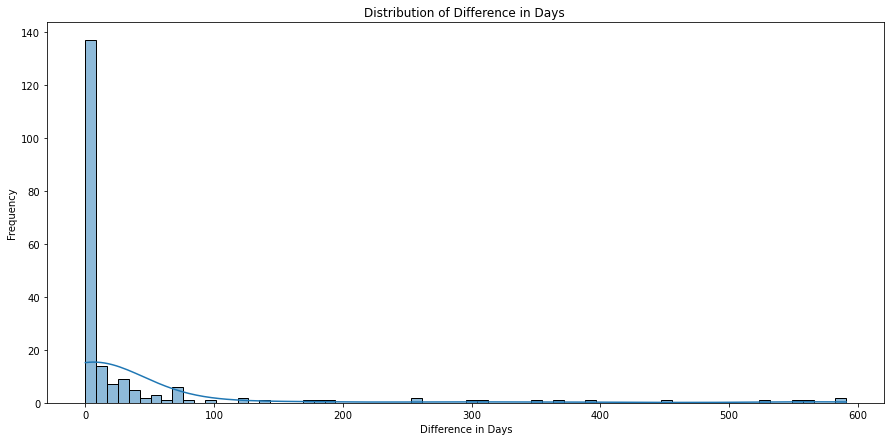

In [85]:
import pandas as pd
import plotly.express as px
import seaborn as sns 


plt.figure(figsize=(15, 7))
ax = sns.histplot(df2[df2['Priorité']==1 ]['Difference in Days'], bins=70, kde=True)
plt.title('Distribution of Difference in Days ')
plt.xlabel('Difference in Days')
plt.ylabel('Frequency')

# Increase the size of the x-axis labels

plt.show()

In [47]:
df2['Priorité'].value_counts()

3       5868
2       4808
1        213
DATA       1
Name: Priorité, dtype: int64

In [40]:
df2['Statut'].value_counts() 

Clôturé automatiquement            7932
Clôturé                            2581
Annulation utilisateur              127
En cours                             83
Résolu                               81
Suspendu                             30
Redirigé                             23
En attente de montée de version      22
Incident lié                          8
Refus de la solution                  6
Réouvert                              1
COM BCP BASE CLIENT PARTENAIRE        1
Name: Statut, dtype: int64

In [24]:
df2[df2['Statut']=='Clôturé automatiquement']  

,Numéro ticket,Statut,Priorité,Date de création,Date de création de l'action en cours,Date de prise en charge de l'action en cours,Sujet,Brève description,Objet de l'incident,Groupe,...,Intervenant,Solution,Entité du responsable du groupe de la dernière action,Cause réelle,Code Appli,Code Domaine,Incident pére,N° Problème,Bénéficiaire,Date de résolution
0,I160519_0150,Clôturé automatiquement,3,2016-05-19 10:41:48,2016-05-19 13:49:12,2016-08-31 17:19:26,Incidents/Informatique/Application métier,NaN,Besoin de connexion aux bases de données suiva...,DATA PROD,...,"Feuillard, Pierre",NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BUO,DSI,NaN,NaN,Pontani Loic,2016-08-31 17:19:26
1,I160519_0151,Clôturé automatiquement,3,2016-05-19 11:00:06,2016-05-19 11:03:17,2016-05-19 11:30:23,Incidents/Informatique/Application métier,NaN,"Bonjour,, _x000D_\nSerait-il possible de mettr...",COM BCP BASE CLIENT PARTENAIRE,...,"Witecki, Luc","Bonjour,_x000D_\nType de registre enregistré._...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,Marechal-caillot Sandrine,2016-05-19 11:30:23
3,I160519_0186,Clôturé automatiquement,3,2016-05-19 12:17:40,2016-05-19 13:45:39,2016-05-19 17:04:22,Incidents/Informatique/Application métier,NaN,Je n'arrive pas et le correspondant informatiq...,COM BCP BASE CLIENT PARTENAIRE,...,"Witecki, Luc","Bonjour,_x000D_\nJe vous ai retiré le SIREN du...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,Le berre Anne,2016-05-19 17:04:22
4,I160519_0200,Clôturé automatiquement,3,2016-05-19 13:13:11,2016-06-16 16:29:52,2017-02-09 17:41:23,Incidents/Informatique/Application métier,NaN,"Sur la CP ""SAS Immobiliere du Midi"" CP n°04124...",COM BCP BASE CLIENT PARTENAIRE,...,"Witecki, Luc","Bonjour,_x000D_\nNous pensons que l’incident e...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,Azema Jean louis,2017-02-09 17:41:23
5,I160520_0037,Clôturé automatiquement,3,2016-05-20 10:19:15,2016-05-20 10:30:25,2016-05-20 11:18:05,Incidents/Informatique/Application métier,NaN,merci de renseigner pour le LCL code banque 30...,COM BCP BASE CLIENT PARTENAIRE,...,"Witecki, Luc","Bonjour,_x000D_\nType de registre enregistré._...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,Chauvin Veronique,2016-05-20 11:18:05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10787,I210305_0049,Clôturé automatiquement,2,2021-03-05 10:01:32,2021-03-05 14:48:14,2021-03-05 14:48:14,Incidents/Informatique/Infrastructure/Infogérant,2021-03-05 10:01:02 Job J8DIP0JA [Group: J0CTR...,2021-03-05 10:01:02 Job J8DIP0JA [Group: J0CTR...,DATA CORE BANKING,...,"Mekati, Younes",problème lié à des doublons et aux répertoires...,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Anomalie technique,IFO,REF,NaN,NaN,Infogérant ATOS,2021-03-05 14:48:14
10788,I210305_0056,Clôturé automatiquement,2,2021-03-05 10:09:49,2021-03-05 10:27:10,2021-03-05 10:27:11,Incidents/Informatique/Application métier,NaN,"Bonjour, Je rencontre un problème sur l'entrep...",COM BCP BASE CLIENT PARTENAIRE,...,"Roch, Olivier","Bonjour,_x000D_\nPour attribuer le role de dir...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Manque d'information,BCP,COM,NaN,NaN,Pinot Baptiste,2021-03-05 10:27:10
10792,I210305_0122,Clôturé automatiquement,3,2021-03-05 13:10:27,2021-03-05 15:18:14,2021-03-05 15:18:14,Incidents/Informatique/Application métier,NaN,"Bonjour,Je n'arrive pas à modifier la date de ...",COM BCP BASE CLIENT PARTENAIRE,...,"Roch, Olivier","Bonjour,_x000D_\nJ'ai pu ajouter la date de na...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Manque d'information,BCP,COM,NaN,NaN,Serrano Celine,2021-03-05 15:18:14
10799,I210308_0148,Clôturé automatiquement,2,2021-03-08 12:15:40,2021-03-08 15:13:26,2021-03-08 15:13:27,Incidents/Informatique/Application métier,NaN,"Bonjour,Pouvez-vous ajouter SVP l'onglet ""Rése...",DATA REPORTING,...,"Bui, Christophe","Bonjour,_x000D_\n _

In [42]:

df2['Date de création'] = pd.to_datetime(df2['Date de création'])
df2['Date de résolution'] = pd.to_datetime(df2['Date de résolution'])


In [45]:
df2['Difference in Days'] = (df2['Date de résolution'] - df2['Date de création']).dt.days

# Display the DataFrame with the new column
df2

,Numéro ticket,Statut,Priorité,Date de création,Date de création de l'action en cours,Date de prise en charge de l'action en cours,Sujet,Brève description,Objet de l'incident,Groupe,Type de groupe,Intervenant,Solution,Entité du responsable du groupe de la dernière action,Cause réelle,Code Appli,Code Domaine,Incident pére,N° Problème,Bénéficiaire,Date de résolution,Difference in Days
0,I160519_0150,Clôturé automatiquement,3,2016-05-19 10:41:48,2016-05-19 13:49:12,2016-08-31 17:19:26,Incidents/Informatique/Application métier,NaN,Besoin de connexion aux bases de données suiva...,DATA PROD,DATA,"Feuillard, Pierre",NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BUO,DSI,NaN,NaN,"Pontani, Loic",2016-08-31 17:19:26,104.0
1,I160519_0151,Clôturé automatiquement,3,2016-05-19 11:00:06,2016-05-19 11:03:17,2016-05-19 11:30:23,Incidents/Informatique/Application métier,NaN,"Bonjour,, _x000D_\nSerait-il possible de mettr...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nType de registre enregistré._...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Marechal-caillot, Sandrine",2016-05-19 11:30:23,0.0
2,I160519_0176,Clôturé,3,2016-05-19 11:41:04,2016-05-19 11:48:35,2016-05-19 12:13:04,Incidents/Informatique/Application métier,NaN,Bonjour merci d'indiquer Registre du commerce ...,COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nType de registre enregistré._...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Roux, Chantal",2016-05-19 12:13:04,0.0
3,I160519_0186,Clôturé automatiquement,3,2016-05-19 12:17:40,2016-05-19 13:45:39,2016-05-19 17:04:22,Incidents/Informatique/Application métier,NaN,Je n'arrive pas et le correspondant informatiq...,COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nJe vous ai retiré le SIREN du...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Le berre, Anne",2016-05-19 17:04:22,0.0
4,I160519_0200,Clôturé automatiquement,3,2016-05-19 13:13:11,2016-06-16 16:29:52,2017-02-09 17:41:23,Incidents/Informatique/Application métier,NaN,"Sur la CP ""SAS Immobiliere du Midi"" CP n°04124...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Witecki, Luc","Bonjour,_x000D_\nNous pensons que l’incident e...",Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Azema, Jean louis",2017-02-09 17:41:23,266.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10895,I210319_0267,En cours,2,2021-03-19 18:29:33,2021-03-22 08:12:47,2021-03-22 08:12:47,Incidents/Informatique/Application métier,NaN,"Bonjour, La société 4065642 MULTI DECK - BOIS...",DATA RISQUES,DATA,NaN,NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BSR,RSQ,NaN,NaN,"Frot-jagoury, Celine",NaT,NaN
10896,I210320_0004,En cours,2,2021-03-20 08:24:27,2021-03-22 09:39:47,2021-03-22 09:39:47,Incidents/Informatique/Infrastructure/Infogérant,2021-03-20 07:47:23 Job J8DCU0HE [Group: J0CTR...,2021-03-20 07:47:23 Job J8DCU0HE [Group: J0CTR...,DATA CORE BANKING,DATA,NaN,NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,Autre – non identifiée,IFO,REF,NaN,NaN,"Infogérant, ATOS",NaT,NaN
10897,I210322_0010,En cours,1,2021-03-22 08:17:07,2021-03-22 09:30:19,2021-03-22 09:30:19,Incidents/Informatique/Application métier,NaN,"Bonjour Jean-Clément,FI pour demander de passe...",COM BCP BASE CLIENT PARTENAIRE,DATA,"Roch, Olivier",NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,NaN,NaN,"Dumas, Valerie",NaT,NaN
10898,I210322_0089,Incident lié,1,2021-03-22 10:12:44,2021-03-22 10:17:52,2021-03-22 10:17:52,Incidents/Informatique/Application métier,NaN,"Bonjour,J'ai vraiment besoin d'accéder à l'app...",COM BCP BASE CLIENT PARTENAIRE,DATA,NaN,NaN,Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET R...,NaN,BCP,COM,I210310_0291,NaN,"Leonetti, Christian",NaT,NaN


<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Difference in Days', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Difference in Days Between Creation and Resolution')

Text(0.5, 0, 'Difference in Days')

Text(0, 0.5, 'Frequency')

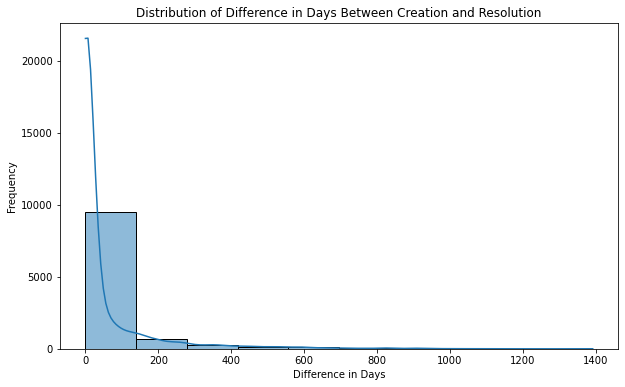

In [46]:
plt.figure(figsize=(10, 6))
sns.histplot(df2['Difference in Days'], bins=10, kde=True)
plt.title('Distribution of Difference in Days Between Creation and Resolution')
plt.xlabel('Difference in Days')
plt.ylabel('Frequency')
plt.show()


In [23]:
df2["Bénéficiaire"].value_counts()  

Infogérant, ATOS        2383
Charignon, Aurelie        75
Chan, Sina                50
Olivier, Jerome           48
Guilleron, Nadege         48
                        ... 
Elbaroudi, Mohamed         1
Cabello, Christophe        1
Sailly, Lorraine           1
Schissler, Charlotte       1
Mouzaia, Nabil             1
Name: Bénéficiaire, Length: 2251, dtype: int64

In [3]:
df_emp = pd.read_csv('employees.csv',skiprows=0) 

df_emp = df_emp.iloc[2:]
df_emp

,ID,"Nom, Prenom"
2,M93280,Morelbiron Carole
3,M16287,Galindo Christophe
4,M67432,USER RESTAIN
5,M67937,Saillant Alexandre
6,M16436,Bailly Malik
...,...,...
1307,M10383,Doret Edouard
1308,M10349,Polizzi Justine
1309,M10589,Regnier Candice
1310,M51777,Tixier Laurent


In [4]:
df2['Bénéficiaire'] = df2['Bénéficiaire'].str.replace(',', '')


In [23]:
df2['Statut'].value_counts()

Clôturé automatiquement            7932
Clôturé                            2581
Annulation utilisateur              127
En cours                             83
Résolu                               81
Suspendu                             30
Redirigé                             23
En attente de montée de version      22
Incident lié                          8
Refus de la solution                  6
Réouvert                              1
COM BCP BASE CLIENT PARTENAIRE        1
Name: Statut, dtype: int64

In [8]:
set_table1 = set(df_emp['Nom, Prenom'])
set_table2 = set(df2['Bénéficiaire'])

# Find common columns
common_columns = set_table1.intersection(set_table2)

# Find columns unique to each table
unique_to_table1 = set_table1.difference(set_table2)
unique_to_table2 = set_table2.difference(set_table1)

# Convert results to lists for better readability
common_names_list = list(common_columns)
unique_to_table1_list = list(unique_to_table1)
unique_to_table2_list = list(unique_to_table2)

# Display the results
print(len(common_names_list) , "Common names:", common_names_list)
print(len(unique_to_table1_list), "names unique to table 1:", unique_to_table1_list)
print(len(unique_to_table2_list),"names unique to table 2:", unique_to_table2_list) 

141 Common names: ['Founani Jihane', 'Desnel Xavier', 'Dabouz Zahir', 'Belhassen Julien', 'Borgi Montassar', 'Louppe Alexandre', 'Ouvry Baptiste', 'Chissey Laurent', 'Merel Veronique', 'Tambrun Pascale', 'Bile Bernadette', 'Strasburger Sylvie', 'Bonnissent Marie', 'Rousselle Christine', 'Agedzi Koffi', 'Fradin Laurence', 'Pessans Elisabeth', 'Remoue Denis', 'Avril Christine', 'Bounet Justine', 'Lelouch Frederic', 'Forissier Axel', 'Chauvet Fabienne', 'Charouk Marc', 'Gelly Cedric', 'Druard Catherine', 'Klutse Cynthia', 'Behar Aurelie', 'Touati Walid', 'Mel Francois', 'Baron Frederic', 'Ranchon Alizee', 'Baderspach Emilie', 'Peron Laurent', 'Petit Nicolas', 'Bouchoucha Jeremie', 'Mongin Gregoire', 'Ronzani Nicolas', 'Sissoko Halimatou', 'Diaz Laurent', 'Sadaoui Hocine', 'Souques Julien', 'Ougloff Stephanie', 'Grudyakova Olga', 'Tixier Laurent', 'Blondel Romuald', 'Mouzaia Nabil', 'Baglin Gerald', 'Caillot Alexis', 'Minoux Eric', 'Fournet Vincent', 'Lamire Oumaima', 'Johnson Kofi', 'Bern

In [14]:
df_group = pd.read_csv('Groupes.csv' , sep=";")
set_table1 = set(df_group['Groupe'])
set_table2 = set(df2['Groupe'])

# Find common columns
common_columns = set_table1.intersection(set_table2)

# Find columns unique to each table
unique_to_table1 = set_table1.difference(set_table2)
unique_to_table2 = set_table2.difference(set_table1)

# Convert results to lists for better readability
common_group_list = list(common_columns)
unique_to_table1_list = list(unique_to_table1)
unique_to_table2_list = list(unique_to_table2)

# Display the results
print(len(common_group_list) , "Common names:", common_group_list)
print(len(unique_to_table1_list), "names unique to table 1:", unique_to_table1_list)
print(len(unique_to_table2_list),"names unique to table 2:", unique_to_table2_list)

4 Common names: [nan, 'BAE INFOCENTRE ASSURANCE EXPORT MOE', 'DATA AE', 'DATA INVEST']
12017 names unique to table 1: ['DHL_VAL_PRO_Mess_BM:CLARITY', 'DHL_VAL_PRO_NAS:EXPORTPPD', 'GGUSRGMPDBAExadataEXA02DBserversRO', 'DHL_VAL_PRO_NAS:DCCPPRD', 'GGUSRGMPSnowpiercerCBIMOERW', 'DHL_VAL_PRO_SHP:FAE IAE', 'GGUSRGMPTransSquadExpressCSIMOARW', 'DHL_VAL_PRO_TEAMS:TT_DCPF_G4', 'GGUSRGMPHyperloopHBOPPDRO', 'DHL_VAL_PRO_Mess_LD:LT_TransSquadExpress-TeamSYT', 'GROUPE_ABO_EVC', 'VAL:GGUSRSHPPRD393', 'DHL_VAL_PRO_ADMIN_SERV:T382A', 'DHL_VAL_PRO_AD:GGUSRLFEGAP', 'DHL_VAL_PRO_SHP:Suivi depenses Cheques DR', 'DHL_VAL_PRO_TEAMS:TT_Service client Bpifrance', 'KSP _ KTR', 'GGUSRGMPTransSquadExpressGTUMOERW', 'DHL_AD:GGUSRGMPSnowpiercerDPTMOERO', 'DHL_VAL_PRO_TEAMS:TT-LPM', 'DHL_VAL_PRO_ADMIN_SERV:T5A02', 'DHL_VAL_PRO_SHP:Excellence', 'DHL_VAL_PRO_ADMIN_SERV:T3F15', 'DHL_VAL_PRO_ADMIN_SERV:T3E34', 'DHL_VAL_PRO_TEAMS:IEP', 'DHL_VAL_PRO_AD:GGUSRSHPPRD127', 'DHL_VAL_Gestion des Problèmes', 'DHL_VAL_PRO_Mess_L

In [37]:
df_matric = pd.read_csv('Matrice Incident (1) (1).csv' , sep=";")
set_table1 = set(df_matric['Groupe 1'])
set_table2 = set(df2['Groupe'])

# Find common columns
common_columns = set_table1.intersection(set_table2)

# Find columns unique to each table
unique_to_table1 = set_table1.difference(set_table2)
unique_to_table2 = set_table2.difference(set_table1)

# Convert results to lists for better readability
common_group_list = list(common_columns)
unique_to_table1_list = list(unique_to_table1)
unique_to_table2_list = list(unique_to_table2)

# Display the results
print(len(common_group_list) , "Common names:", common_group_list)
print(len(unique_to_table1_list), "names unique to table 1:", unique_to_table1_list)
print(len(unique_to_table2_list),"names unique to table 2:", unique_to_table2_list)

0 Common names: []
229 names unique to table 1: ['INO CASSIOPAE WEB CONTENTIEUX METIER', 'GAR AGORA METIER', 'REF – Millenium Transverse', 'COF RAC LIGIS', 'BAE GENERAFI MOE', 'TSE - SYT', 'INO CASSIOPAE WEB SRR METIER', 'DAG_Niveau 1', 'REF WORKFLOW DEMANDE CONTENTIEUX METIER', 'ShS - Production', 'kirin', 'CRF GLM METIER', 'DAP - Data Platform Enabler', 'FIA - Team FIA-STG', 'MTR - MaTréso', 'PRETY - SYST', 'ROT - Reporting DOTT', 'CPC LUTTE CONTRE TRAVAIL DISSIMULE', 'DJG - DJG', 'OPC - Opérations comptables', 'GOS - Gestion des Outils de sécurité', 'HAC DSI HACA', 'RGM SUPPORT METIER', 'ShS - SSI', 'RH ADP', 'RRH HRBP FINANCEMENT', 'FPA - Anaplan Budget & Charges', 'ShS - Sourcing', 'COF ESB - INNOVATION METIER', 'Team Direction du Digital', 'RRB - Reporting Réglementaire Financier', 'VFI - Team VFI', 'GAI - PASS - GPU - PTU', 'GPT - Gestion Paie et Temps', 'DMG Implantation', 'CPC_RCI_02', 'DJG Projet', 'MDQ - Data Quality', 'SUPPORT GED METIER', 'ShS - Test', 'ARCHIVAGE NOVADOC',

In [22]:
df_group[df_group['Groupe'].str.contains('DATA PROD' , na=False)]     

,GROUP_ID,Groupe,Nom du responsable,Niveau du groupe,Pays,Alerte Mail,Employee du groupe,Type groupe,Profil manager,Date de fin,Courriel,Train,E_IS_SHARED_SERVICE,Commentaire,GROUP_SP,Unnamed: 15
1538,1596,OLD DATA PROD,"Konate, Muriel",20,France,1,"\r\n\t\r\n\t\r\n\tLogin\r\n\tNom, Prénom\r\n\t...",DATA,OPERATEUR DSI,10/02/2022 17:21:13,NaN,NaN,NaN,Ajout d'utilisateurs suite à la demande S21111...,[DATA MOA],NaN


In [18]:
df2['Priorité'].value_counts()

3       5868
2       4808
1        213
DATA       1
Name: Priorité, dtype: int64

In [17]:
null_percentage = df2.isnull().mean() * 100

null_percentage_sorted = null_percentage.sort_values(ascending=False)

null_percentage_sorted  

Incident pére                                            98.495413
N° Problème                                              96.990826
Brève description                                        78.110092
Intervenant                                              19.211009
Cause réelle                                             14.532110
Code Domaine                                              4.724771
Code Appli                                                4.688073
Solution                                                  3.788991
Date de résolution                                        1.605505
Objet de l'incident                                       0.165138
Priorité                                                  0.091743
Entité du responsable du groupe de la dernière action     0.064220
Bénéficiaire                                              0.064220
Type de groupe                                            0.064220
Groupe                                                    0.06

In [15]:
df2['Solution'].value_counts()

Bonjour,_x000D_\n_x000D_\nDans le cadre du suivi de notre processus de gestion des incidents, nous avons relevé à ce jour environ 1.000 tickets âgés de plus de 2 mois qui ne sont pas clôturés, alors que leur statut n’indique pas qu’ils sont en attente de montée de version._x000D_\n_x000D_\nIl apparaît qu’un nombre important de ces tickets représentent des Incidents qui ont été traités mais qui sont techniquement restés ouverts._x000D_\n_x000D_\nNous souhaitons mettre en place un meilleur dispositif de suivi des tickets qui présentent un délai de résolution anormalement long._x000D_\n_x000D_\nPour lancer ce nouveau dispositif, il nous faut solder le passé, en éliminant les tickets anciens non clôturés pour des raisons techniques et conserver ceux qui ne sont pas traités mais qui doivent l’être. Nous aurons besoin de votre collaboration pour procéder à ce tri et nous vous en remercions par avance._x000D_\n_x000D_\nPour ce faire, nous allons lancer à partir du 7/9/2020 une demande de clôt

In [13]:
df2['Groupe'].value_counts()

COM BCP BASE CLIENT PARTENAIRE         6315
DATA CORE BANKING                      1426
DATA RISQUES                           1073
DATA PROD                               795
DATA REPORTING                          346
DATA FINANCE CDG                        258
DATA QUALIF                             203
BAE INFOCENTRE ASSURANCE EXPORT MOE     169
DSI INTUIZ                              139
DATA AE                                 108
DATA INVEST                              33
Titrisation DATA                         16
DEC PROJET BII-IFO                        2
DATA IA                                   2
DATA PLATEFORME BIGDATA                   2
DEC SDD                                   1
PCR QLS DAR TECHNIQUE                     1
DEC ZDP                                   1
DEC Dispatcher                            1
DEC MOA                                   1
COM MAO                                   1
Name: Groupe, dtype: int64

In [12]:
df2['Entité du responsable du groupe de la dernière action'].value_counts()

Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET RISQUES/DIRECTION DES SYSTEMES D'INFORMATION/DIRECTION DATA & IA/DATA AUGMENTEE/REPORTING & REGLEMENTAIRE                           6315
Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET RISQUES/DIRECTION DES SYSTEMES D'INFORMATION/DIRECTION DATA & IA/DATA FACTORY/PILOTAGE SI PRODUCTION                                4437
Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET RISQUES/DIRECTION DES SYSTEMES D'INFORMATION/DIRECTION DATA & IA/DATA AUGMENTEE/REFERENTIELS                                         139
Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET RISQUES/DIRECTION DES SYSTEMES D'INFORMATION/DIRECTION DES PROJETS ET SOLUTIONS METIERS/DOMAINE FINANCEMENT/SERVICE FRONT OFFICE       1
Bpifrance/DIRECTION GENERALE/DGA-FINANCES ET RISQUES/DIRECTION DES SYSTEMES D'INFORMATION/DIRECTION DATA/DOMAINE VALORISATION DES DONNEES                                           1
Name: Entité du responsable du groupe de la dernière action, dtype: int64

In [11]:
df2['N° Problème'].value_counts() 

P190620_0001    55
P191211_0001    33
P200423_0001    28
P201112_0001    21
P201110_0001    13
P191016_0001    13
P200324_0001    12
P191107_0001    12
P191017_0002     9
P190411_0001     8
P190820_0001     8
P190417_0001     7
P190821_0001     7
P201218_0001     6
P200304_0001     6
P201202_0001     5
P190212_0002     5
P210315_0001     5
P200318_0001     5
P200623_0001     4
P200123_0001     4
P201005_0001     4
P200921_0003     4
P191030_0001     4
P200917_0003     4
P200311_0003     3
P201118_0001     3
P200811_0001     2
P200911_0002     2
P200923_0001     2
P200416_0001     2
P210129_0002     2
P200410_0001     2
P180626_0001     2
P190906_0001     2
P180809_0002     2
P200330_0001     1
P190522_0001     1
P210309_0002     1
P210224_0001     1
P180628_0009     1
P210107_0002     1
P180627_0002     1
P210212_0001     1
P180628_0010     1
P180628_0011     1
P201012_0001     1
P180628_0002     1
P190808_0001     1
P200925_0001     1
P190821_0002     1
P190827_0001     1
P190918_0001

In [10]:
df2['Bénéficiaire'].value_counts() 

Infogérant, ATOS        2383
Charignon, Aurelie        75
Chan, Sina                50
Olivier, Jerome           48
Guilleron, Nadege         48
                        ... 
Elbaroudi, Mohamed         1
Cabello, Christophe        1
Sailly, Lorraine           1
Schissler, Charlotte       1
Mouzaia, Nabil             1
Name: Bénéficiaire, Length: 2251, dtype: int64

In [11]:
df.head()

,Num�ro de ticket,[Description courte incident],Service manager HELP,Nom application,Date de cr�ation,Dur�e de premi�re prise en charge,Date de r�solution,Date de r�solution maximum,Statut du ticket,Type de ticket,Cause,Cause r�elle,Nom de l'action,Intervenant en charge,_IDApplication,Unnamed: 15
0,I240215_0301,PROBLEME DE DESCENTE CASSIOPAE,https://com15.easyvista.com/autoconnect_mail.p...,OAD Octroi - GDC,15/02/2024 16:31:00,Non Renseign�e,15/02/2024 17:18:00,16/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|GDC,NaN
1,I240215_0299,Notification dossier,https://com15.easyvista.com/autoconnect_mail.p...,OAD Octroi - GDC,15/02/2024 16:23:00,Non Renseign�e,15/02/2024 16:53:00,16/02/2024 :,-,Assistance,Erreur d�utilisation applicative,Erreur d�utilisation applicative,-,-,202402|GDC,NaN
2,I240215_0271,configuration ibm,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:46:00,Non Renseign�e,15/02/2024 15:47:00,21/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|,NaN
3,I240215_0260,2e mobile sur IBM,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:34:00,Non Renseign�e,15/02/2024 15:36:00,21/02/2024 :,-,Assistance,Manque d'information,Manque d'information,-,-,202402|,NaN
4,I240215_0258,�cran externe non reconnu,https://com15.easyvista.com/autoconnect_mail.p...,-,15/02/2024 15:31:00,16,-,21/02/2024 :,En cours,Assistance,-,-,Traitement de l'incident,-,202402|,NaN


In [15]:
date_columns = ['Date de cr�ation']
for col in date_columns: 
    df[col] = pd.to_datetime(df[col], format='%d/%m/%Y %H:%M:%S', errors='coerce')

# Sort the DataFrame by 'Date de création'
df_sorted = df.sort_values(by='Date de cr�ation' , ascending=False)

# Display the sorted DataFrame
df_sorted.head() 

,Num�ro de ticket,[Description courte incident],Service manager HELP,Nom application,Date de cr�ation,Dur�e de premi�re prise en charge,Date de r�solution,Date de r�solution maximum,Statut du ticket,Type de ticket,Cause,Cause r�elle,Nom de l'action,Intervenant en charge,_IDApplication,Unnamed: 15
102015,I240216_0001,JD6OA0JB Lancer le batch BAE_MOS_OA_TMRBLIOJ,https://com15.easyvista.com/autoconnect_mail.p...,MOSAIC - Gestion de l�Assurance-Cr�dit,2024-02-16 00:01:00,Non Renseign�e,-,16/02/2024 :,En cours,Incident,-,-,Traitement de l'incident,-,202402|MOS,NaN
102014,I240216_0002,JBCJC0J0 Export des fichiers Portfolio*.xml de...,https://com15.easyvista.com/autoconnect_mail.p...,Pilotage activit� (CLARITY),2024-02-16 00:01:00,Non Renseign�e,-,16/02/2024 :,En cours,Incident,-,-,Traitement de l'incident,-,202402|CLY,NaN
102016,I240215_0328,JBCJC0J0 Export des fichiers Portfolio*.xml de...,https://com15.easyvista.com/autoconnect_mail.p...,Pilotage activit� (CLARITY),2024-02-15 23:32:00,Non Renseign�e,-,16/02/2024 :,En cours,Incident,-,-,Traitement de l'incident,-,202402|CLY,NaN
102017,I240215_0325,incident 150224 impossibilit� d'ouvrir Delta R...,https://com15.easyvista.com/autoconnect_mail.p...,RCI (Delta RM),2024-02-15 21:05:00,Non Renseign�e,-,22/02/2024 :,En cours,Incident,-,-,Traitement de l'incident,-,202402|RCI,NaN
102018,I240215_0324,AGORA,https://com15.easyvista.com/autoconnect_mail.p...,AGORA,2024-02-15 20:04:00,Non Renseign�e,-,22/02/2024 :,En cours,Incident,-,-,Traitement de l'incident,-,202402|AGR,NaN


In [14]:
df_sorted.

,Num�ro de ticket,[Description courte incident],Service manager HELP,Nom application,Date de cr�ation,Dur�e de premi�re prise en charge,Date de r�solution,Date de r�solution maximum,Statut du ticket,Type de ticket,Cause,Cause r�elle,Nom de l'action,Intervenant en charge,_IDApplication,Unnamed: 15
445380,-,-,-,-,NaT,-,-,-,-,-,-,-,-,-,202402|WCX,NaN
445381,-,-,-,-,NaT,-,-,-,-,-,-,-,-,-,202402|WDI,NaN
445382,-,-,-,-,NaT,-,-,-,-,-,-,-,-,-,202402|WFD,NaN
445383,-,-,-,-,NaT,-,-,-,-,-,-,-,-,-,202402|WPA,NaN
445384,-,-,-,-,NaT,-,-,-,-,-,-,-,-,-,APPLI/NR,NaN


In [4]:
df['Statut'].value_counts()

Clôturé automatiquement            7932
Clôturé                            2581
Annulation utilisateur              127
En cours                             83
Résolu                               81
Suspendu                             30
Redirigé                             23
En attente de montée de version      22
Incident lié                          8
Refus de la solution                  6
Réouvert                              1
COM BCP BASE CLIENT PARTENAIRE        1
Name: Statut, dtype: int64